In [1]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import os
import numpy as np
from tqdm import tqdm


# Device Configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Hyperparameters
batch_size = 16
img_height, img_width = 224, 224
num_classes = 3
epochs = 25
lr = 0.001
checkpoint_dir = 'checkpoints/'
os.makedirs(checkpoint_dir, exist_ok=True)



Using device: cuda


In [2]:
!pip install albumentations[imgaug] -U


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.9/227.9 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 606.4/606.4 kB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.7/291.7 kB 19.6 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.17
    Uninstalling albucore-0.0.17:
      Successfully uninstalled albucore-0.0.17
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.17
    Uninstalling albumentations-1.4.17:
      Successfully uninstalled albumentations-1.4.17


In [3]:
from albumentations import (
    Resize, Normalize, HorizontalFlip, VerticalFlip, RandomBrightnessContrast, ShiftScaleRotate, Compose
)
from albumentations.pytorch import ToTensorV2


In [5]:
input_sizes = {
    "EfficientNet": (528, 528),
    "NASNet": (331, 331),
    "MobileNet": (224, 224)
}

batch_sizes = {
    "EfficientNet": 6,
    "NASNet": 12,
    "MobileNet": 32
}

In [6]:

# Custom dataset with dynamic resizing
class DynamicResizeDataset(Dataset):
    def __init__(self, image_folder_dataset, model_name, input_sizes, mean, std):
        self.dataset = image_folder_dataset
        self.input_size = input_sizes[model_name]
        self.transform = Compose([
            Resize(*self.input_size),  # Dynamic resizing
            HorizontalFlip(p=0.5),                           # Random horizontal flip
            VerticalFlip(p=0.2),                             # Random vertical flip
            ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),  # Geometric transforms
            RandomBrightnessContrast(p=0.2),                # Adjust brightness and contrast
            Normalize(mean=mean, std=std),  # Normalize to ImageNet standards
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        image = np.array(image)
        transformed = self.transform(image=image)
        return transformed['image'], label

# Mean and std for normalization
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Initialize datasets and loaders
datasets_dictionary = {
    f'{model_name}_{split}': DynamicResizeDataset(
        image_folder_dataset=datasets.ImageFolder(root=f"/kaggle/input/bean-leaf-dataset/{split}/{split}"),
        model_name=model_name,
        input_sizes=input_sizes,
        mean=mean,
        std=std
    )
    for model_name in input_sizes
    for split in ["train", "validation", "test"]
}

# DataLoaders
loaders = {
    model_name: {
        split: DataLoader(datasets_dictionary[f"{model_name}_{split}"], batch_size=batch_sizes[model_name], shuffle=(split == "train"), num_workers=4)
        for split in ["train", "validation", "test"]
    }
    for model_name in input_sizes
}

{'EfficientNet_train': <__main__.DynamicResizeDataset object at 0x79db844a86a0>, 'EfficientNet_validation': <__main__.DynamicResizeDataset object at 0x79db844a8c10>, 'EfficientNet_test': <__main__.DynamicResizeDataset object at 0x79db844aa740>, 'NASNet_train': <__main__.DynamicResizeDataset object at 0x79db844a9540>, 'NASNet_validation': <__main__.DynamicResizeDataset object at 0x79db8464f0d0>, 'NASNet_test': <__main__.DynamicResizeDataset object at 0x79db8464fe50>, 'MobileNet_train': <__main__.DynamicResizeDataset object at 0x79db8464ef50>, 'MobileNet_validation': <__main__.DynamicResizeDataset object at 0x79db8464e890>, 'MobileNet_test': <__main__.DynamicResizeDataset object at 0x79db8464d4e0>}


In [7]:
# Model Definition
def create_models(pretrained_model, model_name, dropout_rate=0.3, num_classes=num_classes):
    model = pretrained_model

    # Attempt to find and replace the final classification layer dynamically for NASNet
    if model_name == "NASNet":
        found = False
        for name, module in model.named_children():
            if isinstance(module, nn.Linear):
                in_features = module.in_features
                setattr(model, name, nn.Sequential(
                    nn.Dropout(dropout_rate),
                    nn.Linear(in_features, num_classes)
                ))
                found = True
                break
            elif isinstance(module, nn.Sequential):
                for sub_name, sub_module in module.named_children():
                    if isinstance(sub_module, nn.Linear):
                        in_features = sub_module.in_features
                        module._modules[sub_name] = nn.Sequential(
                            nn.Dropout(dropout_rate),
                            nn.Linear(in_features, num_classes)
                        )
                        found = True
                        break
        if not found:
            raise AttributeError(f"NASNet model does not have a compatible classification layer.")
        return model.to(device)

    # Handle other models like EfficientNet, MobileNet, ResNet, etc.
    if hasattr(model, 'classifier'):
        in_features = model.classifier[1].in_features
        model.classifier = nn.Sequential(
            nn.Dropout(dropout_rate),
            nn.Linear(in_features, num_classes)
        )
    elif hasattr(model, 'fc'):
        in_features = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(dropout_rate),
            nn.Linear(in_features, num_classes)
        )
    else:
        raise AttributeError(f"Unsupported model type for {type(model)}; could not locate a classification layer.")
    
    return model.to(device)




# Training With Gradient Accumulation

### *Problem*: 
EfficientNet-B6's memory demands exceeded your GPU's capacity for large batch sizes.
### *Solution*: 
Accumulating gradients over multiple steps simulates a larger batch size while keeping memory usage low.

### **Why Gradient Accumulation?**
    Gradient accumulation is used when training large models like EfficientNet-B6 on GPUs with limited memory. These models demand significant memory due to their size, input resolution, and batch size requirements. By splitting a batch into smaller chunks (micro-batches), gradient accumulation enables training with an effective larger batch size without exceeding memory limits.
    
### **How It Works**
1. *Divide the Batch into Micro-Batches*:
Instead of processing the entire batch at once, the model processes smaller chunks (e.g., 32 images at a time).

2. *Scale the Loss*:
Each micro-batch's loss is divided by the number of accumulation steps (accumulation_steps) to ensure the total loss matches the original batch size.
```python
loss = criterion(outputs, labels) / accumulation_steps
```


3. *Accumulate Gradients*:
Gradients from the micro-batches are calculated using loss.backward() but not applied immediately to the model parameters.

4. *Update Parameters*:
After processing all micro-batches (or every accumulation_steps), the optimizer updates the parameters. The gradients are then reset using optimizer.zero_grad().
```python
if (step + 1) % accumulation_steps == 0:
    optimizer.step()
    optimizer.zero_grad()
```

In [8]:
def train_model(
    model_name, optimizer_name, model, train_loader, val_loader, optimizer, criterion, num_epochs, 
    accumulation_steps=32, early_stopping_patience=3
):
    best_accuracy = 0.0
    best_val_loss = float('inf')
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    patience_counter = 0  # Tracks epochs without improvement for early stopping
    
    for epoch in range(num_epochs):
        model.train()
        train_loss, correct = 0, 0
        optimizer.zero_grad()  # Clear gradients at the start
        
        for step, (images, labels) in enumerate(tqdm(train_loader)):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels) / accumulation_steps  # Scale loss
            
            loss.backward()  # Accumulate gradients
            train_loss += loss.item() * images.size(0) * accumulation_steps
            correct += (outputs.argmax(1) == labels).sum().item()
            
            # Perform optimizer step every `accumulation_steps`
            if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
                optimizer.step()
                optimizer.zero_grad()
        
        train_loss /= len(train_loader.dataset)
        train_acc = correct / len(train_loader.dataset)
        
        # Validation phase
        model.eval()
        val_loss, correct = 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                correct += (outputs.argmax(1) == labels).sum().item()
        
        val_loss /= len(val_loader.dataset)
        val_acc = correct / len(val_loader.dataset)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
        
        # Save the best model based on validation accuracy
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_accuracy = val_acc
            torch.save(model.state_dict(), os.path.join(checkpoint_dir, f'{model_name}_{optimizer_name}_best_model.h5'))
            print(f"New best model saved with Val Loss: {best_val_loss:.4f} and Val Acc: {best_accuracy:.4f}")
            patience_counter = 0  # Reset patience counter
        else:
            patience_counter += 1
            print(f"No improvement in val_loss. Patience: {patience_counter}")
        
        # Early stopping condition
        if patience_counter >= early_stopping_patience:
            print(f"Early stopping triggered after {patience_counter} epochs without improvement.")
            break

    return history


# Evaluation using ROC curve, Auccuracy, Confusion Matrix, Precision, Recall and F1 Score

In [18]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from timm import create_model

# Evaluation Function
def evaluate_model(model, test_loader, model_name, optimizer_name, num_classes=3):
    model.eval()
    all_labels = []
    all_preds = []
    all_probs = []
    criterion = nn.CrossEntropyLoss()
    test_loss, correct = 0, 0
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            
            # Softmax to get probabilities
            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(1)
            
            all_probs.extend(probs.cpu().numpy())  # Store probabilities
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            
            test_loss += criterion(outputs, labels).item() * images.size(0)
            correct += (preds == labels).sum().item()
    
    # Calculate metrics
    test_loss /= len(test_loader.dataset)
    test_acc = correct / len(test_loader.dataset)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    conf_matrix = confusion_matrix(all_labels, all_preds)
    
    # ROC Curve for multiclass
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    # For each class, calculate the ROC curve
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(np.array(all_labels) == i, np.array([p[i] for p in all_probs]))
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Macro-average ROC curve
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= num_classes
    roc_auc["macro"] = auc(all_fpr, mean_tpr)
    
    print(f"{model_name} with {optimizer_name} - Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")
    
    # Return metrics for visualization
    return {
        "test_loss": test_loss,
        "test_acc": test_acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "conf_matrix": conf_matrix,
        "fpr": fpr,
        "tpr": tpr,
        "roc_auc": roc_auc,
    }

pretrained_models = {
    "NASNet": lambda: create_model('nasnetalarge', pretrained=True),  # NASNet Large
    "EfficientNet": lambda: models.efficientnet_b6(pretrained=True),
    "MobileNet": lambda: models.mobilenet_v2(pretrained=True)
}

optimizers = {
    "Adam": optim.Adam,
    "RMSprop": optim.RMSprop,
    "Nadam": lambda params, lr: optim.NAdam(params, lr=lr)  # Nadam isn't directly available in all PyTorch versions
}



# Training Results

In [10]:
histories = {}
evaluation_results = {}
models_dictionary = {}


In [11]:
# Loop over each model
for model_name, model_fn in pretrained_models.items():
    print(f"Training {model_name}...")
    
    # Dynamically set data loaders based on the model's input size
    train_loader = loaders[model_name]["train"]
    val_loader = loaders[model_name]["validation"]
    test_loader = loaders[model_name]["test"]
    
    for optimizer_name, optimizer_fn in optimizers.items():
        # Reload the model for each optimizer
        pretrained_model = model_fn()  # Create a fresh model instance
        model = create_models(pretrained_model, model_name)
        
        # Set optimizer and loss function
        optimizer = optimizer_fn(model.parameters(), lr=lr)
        criterion = nn.CrossEntropyLoss()
        
        print(f"Using Optimizer: {optimizer_name}")
        
        # Training the model
        history = train_model(model_name, optimizer_name, model, train_loader, val_loader, optimizer, criterion, epochs)
        histories[f"{model_name}_{optimizer_name}"] = history  # Store history
        
        # Evaluating the model
        eval_result = evaluate_model(model, test_loader, model_name, optimizer_name)
        evaluation_results[f"{model_name}_{optimizer_name}"] = eval_result

        # Store the trained model
        models_dictionary[f"{model_name}_{optimizer_name}"] = model
        

Training NASNet...


model.safetensors:   0%|          | 0.00/356M [00:00<?, ?B/s]

Using Optimizer: Adam


100%|██████████| 87/87 [01:19<00:00,  1.09it/s]


Epoch [1/25] - Train Loss: 0.9083, Train Acc: 0.5290, Val Loss: 0.3764, Val Acc: 0.8872
New best model saved with Val Loss: 0.3764 and Val Acc: 0.8872


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [2/25] - Train Loss: 0.2778, Train Acc: 0.8994, Val Loss: 0.1258, Val Acc: 0.9398
New best model saved with Val Loss: 0.1258 and Val Acc: 0.9398


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [3/25] - Train Loss: 0.1969, Train Acc: 0.9284, Val Loss: 0.0468, Val Acc: 0.9774
New best model saved with Val Loss: 0.0468 and Val Acc: 0.9774


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [4/25] - Train Loss: 0.1233, Train Acc: 0.9613, Val Loss: 0.0937, Val Acc: 0.9699
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [5/25] - Train Loss: 0.0877, Train Acc: 0.9710, Val Loss: 0.0526, Val Acc: 0.9850
No improvement in val_loss. Patience: 2


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [6/25] - Train Loss: 0.0893, Train Acc: 0.9700, Val Loss: 0.0101, Val Acc: 1.0000
New best model saved with Val Loss: 0.0101 and Val Acc: 1.0000


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [7/25] - Train Loss: 0.0786, Train Acc: 0.9778, Val Loss: 0.0521, Val Acc: 0.9774
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [8/25] - Train Loss: 0.0791, Train Acc: 0.9758, Val Loss: 0.0392, Val Acc: 0.9850
No improvement in val_loss. Patience: 2


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [9/25] - Train Loss: 0.0602, Train Acc: 0.9845, Val Loss: 0.0955, Val Acc: 0.9699
No improvement in val_loss. Patience: 3


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [10/25] - Train Loss: 0.0462, Train Acc: 0.9884, Val Loss: 0.0307, Val Acc: 0.9925
No improvement in val_loss. Patience: 4


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [11/25] - Train Loss: 0.0577, Train Acc: 0.9855, Val Loss: 0.0631, Val Acc: 0.9850
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.
NASNet with Adam - Test Loss: 0.1516, Test Accuracy: 0.9688
Precision: 0.9696, Recall: 0.9688, F1 Score: 0.9689
Using Optimizer: RMSprop


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [1/25] - Train Loss: 1.2526, Train Acc: 0.3288, Val Loss: 2546805.5301, Val Acc: 0.3308
New best model saved with Val Loss: 2546805.5301 and Val Acc: 0.3308


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [2/25] - Train Loss: 1.8659, Train Acc: 0.3056, Val Loss: 24.2861, Val Acc: 0.2707
New best model saved with Val Loss: 24.2861 and Val Acc: 0.2707


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [3/25] - Train Loss: 1.1786, Train Acc: 0.2882, Val Loss: 1.0164, Val Acc: 0.4887
New best model saved with Val Loss: 1.0164 and Val Acc: 0.4887


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [4/25] - Train Loss: 0.9978, Train Acc: 0.4845, Val Loss: 0.9445, Val Acc: 0.5338
New best model saved with Val Loss: 0.9445 and Val Acc: 0.5338


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [5/25] - Train Loss: 0.9713, Train Acc: 0.5251, Val Loss: 2.0642, Val Acc: 0.5113
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [6/25] - Train Loss: 0.9467, Train Acc: 0.5435, Val Loss: 0.8575, Val Acc: 0.5789
New best model saved with Val Loss: 0.8575 and Val Acc: 0.5789


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [7/25] - Train Loss: 0.9279, Train Acc: 0.5571, Val Loss: 0.9120, Val Acc: 0.6316
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [8/25] - Train Loss: 0.9116, Train Acc: 0.5677, Val Loss: 0.8471, Val Acc: 0.5789
New best model saved with Val Loss: 0.8471 and Val Acc: 0.5789


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [9/25] - Train Loss: 0.8604, Train Acc: 0.5861, Val Loss: 0.9949, Val Acc: 0.4662
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [10/25] - Train Loss: 0.8698, Train Acc: 0.6044, Val Loss: 0.7757, Val Acc: 0.6165
New best model saved with Val Loss: 0.7757 and Val Acc: 0.6165


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [11/25] - Train Loss: 0.8208, Train Acc: 0.6083, Val Loss: 0.7870, Val Acc: 0.6090
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [12/25] - Train Loss: 0.8144, Train Acc: 0.6064, Val Loss: 0.8726, Val Acc: 0.6316
No improvement in val_loss. Patience: 2


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [13/25] - Train Loss: 0.8181, Train Acc: 0.6799, Val Loss: 1.0924, Val Acc: 0.3383
No improvement in val_loss. Patience: 3


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [14/25] - Train Loss: 0.7895, Train Acc: 0.6393, Val Loss: 0.8174, Val Acc: 0.6316
No improvement in val_loss. Patience: 4


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [15/25] - Train Loss: 0.7390, Train Acc: 0.7089, Val Loss: 0.7511, Val Acc: 0.7293
New best model saved with Val Loss: 0.7511 and Val Acc: 0.7293


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [16/25] - Train Loss: 0.6789, Train Acc: 0.7534, Val Loss: 0.8310, Val Acc: 0.5714
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [17/25] - Train Loss: 0.5583, Train Acc: 0.7882, Val Loss: 4.6189, Val Acc: 0.6466
No improvement in val_loss. Patience: 2


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [18/25] - Train Loss: 0.7400, Train Acc: 0.7292, Val Loss: 0.5622, Val Acc: 0.8647
New best model saved with Val Loss: 0.5622 and Val Acc: 0.8647


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [19/25] - Train Loss: 0.7669, Train Acc: 0.6460, Val Loss: 1.8729, Val Acc: 0.7293
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [20/25] - Train Loss: 0.4873, Train Acc: 0.8453, Val Loss: 0.3633, Val Acc: 0.8571
New best model saved with Val Loss: 0.3633 and Val Acc: 0.8571


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [21/25] - Train Loss: 0.4835, Train Acc: 0.8027, Val Loss: 1.8259, Val Acc: 0.6767
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [22/25] - Train Loss: 0.5359, Train Acc: 0.7959, Val Loss: 0.3273, Val Acc: 0.9323
New best model saved with Val Loss: 0.3273 and Val Acc: 0.9323


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [23/25] - Train Loss: 0.4336, Train Acc: 0.8414, Val Loss: 0.1991, Val Acc: 0.9173
New best model saved with Val Loss: 0.1991 and Val Acc: 0.9173


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [24/25] - Train Loss: 0.3690, Train Acc: 0.8743, Val Loss: 0.2020, Val Acc: 0.9323
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [25/25] - Train Loss: 0.3026, Train Acc: 0.8936, Val Loss: 0.1624, Val Acc: 0.9474
New best model saved with Val Loss: 0.1624 and Val Acc: 0.9474
NASNet with RMSprop - Test Loss: 0.2464, Test Accuracy: 0.8906
Precision: 0.8914, Recall: 0.8906, F1 Score: 0.8897
Using Optimizer: Nadam


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [1/25] - Train Loss: 0.9083, Train Acc: 0.5629, Val Loss: 1.5578, Val Acc: 0.6617
New best model saved with Val Loss: 1.5578 and Val Acc: 0.6617


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [2/25] - Train Loss: 0.4634, Train Acc: 0.8143, Val Loss: 0.1282, Val Acc: 0.9398
New best model saved with Val Loss: 0.1282 and Val Acc: 0.9398


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [3/25] - Train Loss: 0.2653, Train Acc: 0.9159, Val Loss: 0.3163, Val Acc: 0.8947
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [4/25] - Train Loss: 0.1963, Train Acc: 0.9381, Val Loss: 0.1183, Val Acc: 0.9699
New best model saved with Val Loss: 0.1183 and Val Acc: 0.9699


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [5/25] - Train Loss: 0.0924, Train Acc: 0.9739, Val Loss: 0.0958, Val Acc: 0.9699
New best model saved with Val Loss: 0.0958 and Val Acc: 0.9699


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [6/25] - Train Loss: 0.0689, Train Acc: 0.9787, Val Loss: 0.0787, Val Acc: 0.9774
New best model saved with Val Loss: 0.0787 and Val Acc: 0.9774


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [7/25] - Train Loss: 0.0648, Train Acc: 0.9816, Val Loss: 0.0449, Val Acc: 0.9850
New best model saved with Val Loss: 0.0449 and Val Acc: 0.9850


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [8/25] - Train Loss: 0.1582, Train Acc: 0.9526, Val Loss: 0.1981, Val Acc: 0.9549
No improvement in val_loss. Patience: 1


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [9/25] - Train Loss: 0.1963, Train Acc: 0.9391, Val Loss: 0.1844, Val Acc: 0.9398
No improvement in val_loss. Patience: 2


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [10/25] - Train Loss: 0.0624, Train Acc: 0.9826, Val Loss: 0.0859, Val Acc: 0.9774
No improvement in val_loss. Patience: 3


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [11/25] - Train Loss: 0.0694, Train Acc: 0.9787, Val Loss: 0.0940, Val Acc: 0.9774
No improvement in val_loss. Patience: 4


100%|██████████| 87/87 [01:18<00:00,  1.11it/s]


Epoch [12/25] - Train Loss: 0.0540, Train Acc: 0.9749, Val Loss: 0.0883, Val Acc: 0.9699
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.
NASNet with Nadam - Test Loss: 0.0952, Test Accuracy: 0.9609
Precision: 0.9616, Recall: 0.9609, F1 Score: 0.9606
Training EfficientNet...


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B6_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B6_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b6_lukemelas-24a108a5.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b6_lukemelas-24a108a5.pth
100%|██████████| 165M/165M [00:00<00:00, 224MB/s] 


Using Optimizer: Adam


100%|██████████| 173/173 [01:33<00:00,  1.85it/s]


Epoch [1/25] - Train Loss: 0.6647, Train Acc: 0.7099, Val Loss: 0.0201, Val Acc: 0.9925
New best model saved with Val Loss: 0.0201 and Val Acc: 0.9925


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [2/25] - Train Loss: 0.2555, Train Acc: 0.9101, Val Loss: 0.0982, Val Acc: 0.9925
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [3/25] - Train Loss: 0.1969, Train Acc: 0.9333, Val Loss: 0.0177, Val Acc: 1.0000
New best model saved with Val Loss: 0.0177 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [4/25] - Train Loss: 0.1189, Train Acc: 0.9623, Val Loss: 0.0434, Val Acc: 0.9774
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [5/25] - Train Loss: 0.1097, Train Acc: 0.9603, Val Loss: 0.0325, Val Acc: 1.0000
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [6/25] - Train Loss: 0.0545, Train Acc: 0.9865, Val Loss: 0.0320, Val Acc: 0.9925
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [7/25] - Train Loss: 0.0558, Train Acc: 0.9865, Val Loss: 0.0583, Val Acc: 0.9850
No improvement in val_loss. Patience: 4


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [8/25] - Train Loss: 0.0321, Train Acc: 0.9923, Val Loss: 0.0125, Val Acc: 1.0000
New best model saved with Val Loss: 0.0125 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [9/25] - Train Loss: 0.0333, Train Acc: 0.9903, Val Loss: 0.0227, Val Acc: 0.9850
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [10/25] - Train Loss: 0.0420, Train Acc: 0.9903, Val Loss: 0.0405, Val Acc: 0.9850
No improvement in val_loss. Patience: 2


 86%|████████▌ | 149/173 [01:20<00:12,  1.87it/s]

Epoch [12/25] - Train Loss: 0.0230, Train Acc: 0.9932, Val Loss: 0.0131, Val Acc: 0.9925
No improvement in val_loss. Patience: 4


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [13/25] - Train Loss: 0.0311, Train Acc: 0.9913, Val Loss: 0.0122, Val Acc: 0.9925
New best model saved with Val Loss: 0.0122 and Val Acc: 0.9925


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [14/25] - Train Loss: 0.0231, Train Acc: 0.9961, Val Loss: 0.0065, Val Acc: 1.0000
New best model saved with Val Loss: 0.0065 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [15/25] - Train Loss: 0.0090, Train Acc: 0.9990, Val Loss: 0.0045, Val Acc: 1.0000
New best model saved with Val Loss: 0.0045 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [16/25] - Train Loss: 0.0218, Train Acc: 0.9961, Val Loss: 0.0029, Val Acc: 1.0000
New best model saved with Val Loss: 0.0029 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [17/25] - Train Loss: 0.0098, Train Acc: 0.9990, Val Loss: 0.0169, Val Acc: 0.9925
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [18/25] - Train Loss: 0.0097, Train Acc: 0.9971, Val Loss: 0.0023, Val Acc: 1.0000
New best model saved with Val Loss: 0.0023 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [19/25] - Train Loss: 0.0170, Train Acc: 0.9913, Val Loss: 0.0064, Val Acc: 1.0000
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [20/25] - Train Loss: 0.0229, Train Acc: 0.9942, Val Loss: 0.0623, Val Acc: 0.9774
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [21/25] - Train Loss: 0.0312, Train Acc: 0.9894, Val Loss: 0.1035, Val Acc: 0.9774
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [22/25] - Train Loss: 0.0340, Train Acc: 0.9903, Val Loss: 0.0357, Val Acc: 0.9925
No improvement in val_loss. Patience: 4


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [23/25] - Train Loss: 0.0226, Train Acc: 0.9952, Val Loss: 0.0113, Val Acc: 0.9925
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.
EfficientNet with Adam - Test Loss: 0.2056, Test Accuracy: 0.9609
Precision: 0.9632, Recall: 0.9609, F1 Score: 0.9609


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B6_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B6_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using Optimizer: RMSprop


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [1/25] - Train Loss: 1.3352, Train Acc: 0.4913, Val Loss: 16.2623, Val Acc: 0.3383
New best model saved with Val Loss: 16.2623 and Val Acc: 0.3383


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [2/25] - Train Loss: 1.0339, Train Acc: 0.5164, Val Loss: 0.5718, Val Acc: 0.8496
New best model saved with Val Loss: 0.5718 and Val Acc: 0.8496


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [3/25] - Train Loss: 0.5577, Train Acc: 0.7930, Val Loss: 0.2537, Val Acc: 0.9098
New best model saved with Val Loss: 0.2537 and Val Acc: 0.9098


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [4/25] - Train Loss: 0.4808, Train Acc: 0.8337, Val Loss: 0.1791, Val Acc: 0.9850
New best model saved with Val Loss: 0.1791 and Val Acc: 0.9850


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [5/25] - Train Loss: 0.2959, Train Acc: 0.9014, Val Loss: 0.1190, Val Acc: 0.9624
New best model saved with Val Loss: 0.1190 and Val Acc: 0.9624


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [6/25] - Train Loss: 0.4420, Train Acc: 0.8511, Val Loss: 0.0973, Val Acc: 0.9850
New best model saved with Val Loss: 0.0973 and Val Acc: 0.9850


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [7/25] - Train Loss: 0.2698, Train Acc: 0.8985, Val Loss: 0.0505, Val Acc: 1.0000
New best model saved with Val Loss: 0.0505 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [8/25] - Train Loss: 0.3013, Train Acc: 0.8859, Val Loss: 0.0378, Val Acc: 1.0000
New best model saved with Val Loss: 0.0378 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [9/25] - Train Loss: 0.1990, Train Acc: 0.9265, Val Loss: 0.0700, Val Acc: 0.9774
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [10/25] - Train Loss: 0.1454, Train Acc: 0.9507, Val Loss: 0.0259, Val Acc: 1.0000
New best model saved with Val Loss: 0.0259 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [11/25] - Train Loss: 0.1045, Train Acc: 0.9632, Val Loss: 0.0399, Val Acc: 0.9850
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [12/25] - Train Loss: 0.1671, Train Acc: 0.9420, Val Loss: 0.0180, Val Acc: 1.0000
New best model saved with Val Loss: 0.0180 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [13/25] - Train Loss: 0.1253, Train Acc: 0.9594, Val Loss: 0.0765, Val Acc: 1.0000
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [14/25] - Train Loss: 0.1975, Train Acc: 0.9333, Val Loss: 0.0415, Val Acc: 0.9925
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [15/25] - Train Loss: 0.1121, Train Acc: 0.9642, Val Loss: 0.0193, Val Acc: 1.0000
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [16/25] - Train Loss: 0.0779, Train Acc: 0.9700, Val Loss: 0.0570, Val Acc: 0.9774
No improvement in val_loss. Patience: 4


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [17/25] - Train Loss: 0.0628, Train Acc: 0.9807, Val Loss: 0.0127, Val Acc: 1.0000
New best model saved with Val Loss: 0.0127 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [18/25] - Train Loss: 0.0768, Train Acc: 0.9681, Val Loss: 0.1687, Val Acc: 0.9398
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [19/25] - Train Loss: 0.0833, Train Acc: 0.9749, Val Loss: 0.0358, Val Acc: 0.9925
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [20/25] - Train Loss: 0.0561, Train Acc: 0.9826, Val Loss: 0.0160, Val Acc: 1.0000
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [21/25] - Train Loss: 0.0442, Train Acc: 0.9855, Val Loss: 0.0121, Val Acc: 0.9925
New best model saved with Val Loss: 0.0121 and Val Acc: 0.9925


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [22/25] - Train Loss: 0.0281, Train Acc: 0.9923, Val Loss: 0.0146, Val Acc: 1.0000
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [23/25] - Train Loss: 0.0489, Train Acc: 0.9845, Val Loss: 0.1926, Val Acc: 0.9699
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [24/25] - Train Loss: 0.2097, Train Acc: 0.9371, Val Loss: 0.1946, Val Acc: 0.9323
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [25/25] - Train Loss: 0.2015, Train Acc: 0.9342, Val Loss: 0.0143, Val Acc: 1.0000
No improvement in val_loss. Patience: 4
EfficientNet with RMSprop - Test Loss: 0.0843, Test Accuracy: 0.9766
Precision: 0.9774, Recall: 0.9766, F1 Score: 0.9764


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B6_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B6_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Using Optimizer: Nadam


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [1/25] - Train Loss: 0.6508, Train Acc: 0.7369, Val Loss: 0.0740, Val Acc: 0.9850
New best model saved with Val Loss: 0.0740 and Val Acc: 0.9850


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [2/25] - Train Loss: 0.2729, Train Acc: 0.9091, Val Loss: 0.1373, Val Acc: 0.9398
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [3/25] - Train Loss: 0.1840, Train Acc: 0.9400, Val Loss: 0.0659, Val Acc: 0.9699
New best model saved with Val Loss: 0.0659 and Val Acc: 0.9699


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [4/25] - Train Loss: 0.1380, Train Acc: 0.9555, Val Loss: 0.0362, Val Acc: 0.9925
New best model saved with Val Loss: 0.0362 and Val Acc: 0.9925


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [5/25] - Train Loss: 0.1615, Train Acc: 0.9429, Val Loss: 0.0821, Val Acc: 0.9774
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [6/25] - Train Loss: 0.3808, Train Acc: 0.8665, Val Loss: 0.0124, Val Acc: 0.9925
New best model saved with Val Loss: 0.0124 and Val Acc: 0.9925


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [7/25] - Train Loss: 0.1198, Train Acc: 0.9691, Val Loss: 0.0314, Val Acc: 0.9925
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [8/25] - Train Loss: 0.0792, Train Acc: 0.9807, Val Loss: 0.0124, Val Acc: 1.0000
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.87it/s]


Epoch [9/25] - Train Loss: 0.0495, Train Acc: 0.9865, Val Loss: 0.0121, Val Acc: 1.0000
New best model saved with Val Loss: 0.0121 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [10/25] - Train Loss: 0.0486, Train Acc: 0.9874, Val Loss: 0.0069, Val Acc: 1.0000
New best model saved with Val Loss: 0.0069 and Val Acc: 1.0000


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [11/25] - Train Loss: 0.0334, Train Acc: 0.9913, Val Loss: 0.0203, Val Acc: 1.0000
No improvement in val_loss. Patience: 1


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [12/25] - Train Loss: 0.0277, Train Acc: 0.9932, Val Loss: 0.0611, Val Acc: 0.9850
No improvement in val_loss. Patience: 2


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [13/25] - Train Loss: 0.0372, Train Acc: 0.9884, Val Loss: 0.0577, Val Acc: 0.9774
No improvement in val_loss. Patience: 3


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [14/25] - Train Loss: 0.0325, Train Acc: 0.9884, Val Loss: 0.0164, Val Acc: 0.9925
No improvement in val_loss. Patience: 4


100%|██████████| 173/173 [01:32<00:00,  1.86it/s]


Epoch [15/25] - Train Loss: 0.0140, Train Acc: 0.9961, Val Loss: 0.0163, Val Acc: 0.9925
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.
EfficientNet with Nadam - Test Loss: 0.0728, Test Accuracy: 0.9844
Precision: 0.9851, Recall: 0.9844, F1 Score: 0.9844
Training MobileNet...


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 138MB/s]


Using Optimizer: Adam


100%|██████████| 33/33 [00:03<00:00,  8.82it/s]


Epoch [1/25] - Train Loss: 1.1487, Train Acc: 0.3395, Val Loss: 0.5633, Val Acc: 0.7669
New best model saved with Val Loss: 0.5633 and Val Acc: 0.7669


100%|██████████| 33/33 [00:03<00:00,  9.11it/s]


Epoch [2/25] - Train Loss: 0.7239, Train Acc: 0.7050, Val Loss: 0.9171, Val Acc: 0.7444
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.16it/s]


Epoch [3/25] - Train Loss: 0.8471, Train Acc: 0.6605, Val Loss: 0.4179, Val Acc: 0.8797
New best model saved with Val Loss: 0.4179 and Val Acc: 0.8797


100%|██████████| 33/33 [00:03<00:00,  9.14it/s]


Epoch [4/25] - Train Loss: 0.3112, Train Acc: 0.8936, Val Loss: 0.1998, Val Acc: 0.9173
New best model saved with Val Loss: 0.1998 and Val Acc: 0.9173


100%|██████████| 33/33 [00:03<00:00,  8.91it/s]


Epoch [5/25] - Train Loss: 0.2329, Train Acc: 0.9207, Val Loss: 0.0551, Val Acc: 0.9850
New best model saved with Val Loss: 0.0551 and Val Acc: 0.9850


100%|██████████| 33/33 [00:03<00:00,  9.18it/s]


Epoch [6/25] - Train Loss: 0.1306, Train Acc: 0.9507, Val Loss: 0.0624, Val Acc: 0.9850
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.11it/s]


Epoch [7/25] - Train Loss: 0.1021, Train Acc: 0.9613, Val Loss: 0.0627, Val Acc: 0.9774
No improvement in val_loss. Patience: 2


100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


Epoch [8/25] - Train Loss: 0.0894, Train Acc: 0.9671, Val Loss: 0.0593, Val Acc: 0.9850
No improvement in val_loss. Patience: 3


100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


Epoch [9/25] - Train Loss: 0.0687, Train Acc: 0.9739, Val Loss: 0.0817, Val Acc: 0.9774
No improvement in val_loss. Patience: 4


100%|██████████| 33/33 [00:03<00:00,  9.13it/s]


Epoch [10/25] - Train Loss: 0.0624, Train Acc: 0.9797, Val Loss: 0.0656, Val Acc: 0.9774
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MobileNet with Adam - Test Loss: 0.1417, Test Accuracy: 0.9609
Precision: 0.9615, Recall: 0.9609, F1 Score: 0.9611
Using Optimizer: RMSprop


100%|██████████| 33/33 [00:03<00:00,  9.06it/s]


Epoch [1/25] - Train Loss: 1.2560, Train Acc: 0.3114, Val Loss: 41.4775, Val Acc: 0.3383
New best model saved with Val Loss: 41.4775 and Val Acc: 0.3383


100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


Epoch [2/25] - Train Loss: 7.4763, Train Acc: 0.1741, Val Loss: 24.3291, Val Acc: 0.3308
New best model saved with Val Loss: 24.3291 and Val Acc: 0.3308


100%|██████████| 33/33 [00:03<00:00,  8.56it/s]


Epoch [3/25] - Train Loss: 1.7189, Train Acc: 0.4923, Val Loss: 14.1432, Val Acc: 0.3233
New best model saved with Val Loss: 14.1432 and Val Acc: 0.3233


100%|██████████| 33/33 [00:03<00:00,  9.01it/s]


Epoch [4/25] - Train Loss: 3.6866, Train Acc: 0.3424, Val Loss: 1.7185, Val Acc: 0.3835
New best model saved with Val Loss: 1.7185 and Val Acc: 0.3835


100%|██████████| 33/33 [00:03<00:00,  9.16it/s]


Epoch [5/25] - Train Loss: 1.2980, Train Acc: 0.5986, Val Loss: 1.7264, Val Acc: 0.3759
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.06it/s]


Epoch [6/25] - Train Loss: 1.3297, Train Acc: 0.3114, Val Loss: 1.1883, Val Acc: 0.3459
New best model saved with Val Loss: 1.1883 and Val Acc: 0.3459


100%|██████████| 33/33 [00:03<00:00,  9.12it/s]


Epoch [7/25] - Train Loss: 1.2628, Train Acc: 0.4159, Val Loss: 2.2542, Val Acc: 0.3609
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


Epoch [8/25] - Train Loss: 1.3411, Train Acc: 0.4004, Val Loss: 1.2888, Val Acc: 0.5338
No improvement in val_loss. Patience: 2


100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


Epoch [9/25] - Train Loss: 1.4673, Train Acc: 0.5793, Val Loss: 1.3005, Val Acc: 0.5789
No improvement in val_loss. Patience: 3


100%|██████████| 33/33 [00:03<00:00,  8.47it/s]


Epoch [10/25] - Train Loss: 0.9191, Train Acc: 0.5677, Val Loss: 0.9099, Val Acc: 0.4812
New best model saved with Val Loss: 0.9099 and Val Acc: 0.4812


100%|██████████| 33/33 [00:03<00:00,  9.12it/s]


Epoch [11/25] - Train Loss: 0.7690, Train Acc: 0.5667, Val Loss: 0.5902, Val Acc: 0.7519
New best model saved with Val Loss: 0.5902 and Val Acc: 0.7519


100%|██████████| 33/33 [00:03<00:00,  9.15it/s]


Epoch [12/25] - Train Loss: 0.6680, Train Acc: 0.7176, Val Loss: 0.5119, Val Acc: 0.7669
New best model saved with Val Loss: 0.5119 and Val Acc: 0.7669


100%|██████████| 33/33 [00:03<00:00,  9.14it/s]


Epoch [13/25] - Train Loss: 0.5362, Train Acc: 0.7911, Val Loss: 0.3909, Val Acc: 0.8797
New best model saved with Val Loss: 0.3909 and Val Acc: 0.8797


100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


Epoch [14/25] - Train Loss: 0.4923, Train Acc: 0.8162, Val Loss: 0.3780, Val Acc: 0.8647
New best model saved with Val Loss: 0.3780 and Val Acc: 0.8647


100%|██████████| 33/33 [00:03<00:00,  9.13it/s]


Epoch [15/25] - Train Loss: 0.4386, Train Acc: 0.8337, Val Loss: 0.3142, Val Acc: 0.9023
New best model saved with Val Loss: 0.3142 and Val Acc: 0.9023


100%|██████████| 33/33 [00:03<00:00,  9.17it/s]


Epoch [16/25] - Train Loss: 0.4177, Train Acc: 0.8385, Val Loss: 0.3209, Val Acc: 0.8947
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.24it/s]


Epoch [17/25] - Train Loss: 0.4104, Train Acc: 0.8511, Val Loss: 0.2735, Val Acc: 0.8797
New best model saved with Val Loss: 0.2735 and Val Acc: 0.8797


100%|██████████| 33/33 [00:03<00:00,  8.64it/s]


Epoch [18/25] - Train Loss: 0.3649, Train Acc: 0.8714, Val Loss: 0.3327, Val Acc: 0.8722
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.26it/s]


Epoch [19/25] - Train Loss: 0.3437, Train Acc: 0.8743, Val Loss: 0.7951, Val Acc: 0.7594
No improvement in val_loss. Patience: 2


100%|██████████| 33/33 [00:03<00:00,  9.17it/s]


Epoch [20/25] - Train Loss: 0.4705, Train Acc: 0.8201, Val Loss: 0.7612, Val Acc: 0.7143
No improvement in val_loss. Patience: 3


100%|██████████| 33/33 [00:03<00:00,  9.22it/s]


Epoch [21/25] - Train Loss: 0.4307, Train Acc: 0.8462, Val Loss: 0.3862, Val Acc: 0.8120
No improvement in val_loss. Patience: 4


100%|██████████| 33/33 [00:03<00:00,  9.15it/s]


Epoch [22/25] - Train Loss: 0.3387, Train Acc: 0.8781, Val Loss: 0.2266, Val Acc: 0.9398
New best model saved with Val Loss: 0.2266 and Val Acc: 0.9398


100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


Epoch [23/25] - Train Loss: 0.2903, Train Acc: 0.8985, Val Loss: 0.1645, Val Acc: 0.9474
New best model saved with Val Loss: 0.1645 and Val Acc: 0.9474


100%|██████████| 33/33 [00:03<00:00,  9.14it/s]


Epoch [24/25] - Train Loss: 0.2339, Train Acc: 0.9178, Val Loss: 0.1480, Val Acc: 0.9624
New best model saved with Val Loss: 0.1480 and Val Acc: 0.9624


100%|██████████| 33/33 [00:03<00:00,  8.64it/s]


Epoch [25/25] - Train Loss: 0.2077, Train Acc: 0.9304, Val Loss: 0.2072, Val Acc: 0.9398
No improvement in val_loss. Patience: 1


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MobileNet with RMSprop - Test Loss: 0.2600, Test Accuracy: 0.9062
Precision: 0.9219, Recall: 0.9062, F1 Score: 0.9079
Using Optimizer: Nadam


100%|██████████| 33/33 [00:03<00:00,  9.15it/s]


Epoch [1/25] - Train Loss: 1.2465, Train Acc: 0.3143, Val Loss: 0.4737, Val Acc: 0.7970
New best model saved with Val Loss: 0.4737 and Val Acc: 0.7970


100%|██████████| 33/33 [00:03<00:00,  9.23it/s]


Epoch [2/25] - Train Loss: 0.5251, Train Acc: 0.7911, Val Loss: 0.3482, Val Acc: 0.8421
New best model saved with Val Loss: 0.3482 and Val Acc: 0.8421


100%|██████████| 33/33 [00:03<00:00,  9.20it/s]


Epoch [3/25] - Train Loss: 0.3967, Train Acc: 0.8472, Val Loss: 0.9968, Val Acc: 0.6767
No improvement in val_loss. Patience: 1


100%|██████████| 33/33 [00:03<00:00,  9.19it/s]


Epoch [4/25] - Train Loss: 0.7001, Train Acc: 0.7292, Val Loss: 1.2283, Val Acc: 0.6692
No improvement in val_loss. Patience: 2


100%|██████████| 33/33 [00:03<00:00,  9.20it/s]


Epoch [5/25] - Train Loss: 0.8064, Train Acc: 0.7031, Val Loss: 1.6310, Val Acc: 0.4962
No improvement in val_loss. Patience: 3


100%|██████████| 33/33 [00:03<00:00,  9.25it/s]


Epoch [6/25] - Train Loss: 0.8077, Train Acc: 0.6741, Val Loss: 2.2138, Val Acc: 0.3684
No improvement in val_loss. Patience: 4


100%|██████████| 33/33 [00:03<00:00,  9.10it/s]


Epoch [7/25] - Train Loss: 1.7142, Train Acc: 0.3868, Val Loss: 0.8560, Val Acc: 0.6842
No improvement in val_loss. Patience: 5
Early stopping triggered after 5 epochs without improvement.
MobileNet with Nadam - Test Loss: 0.9999, Test Accuracy: 0.6406
Precision: 0.7244, Recall: 0.6406, F1 Score: 0.6209


# Evaluation Results

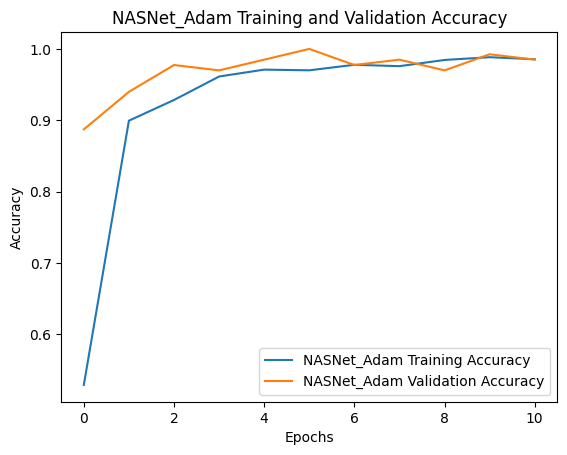

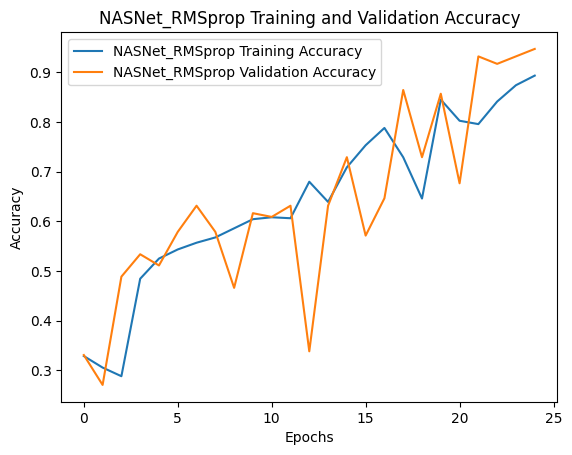

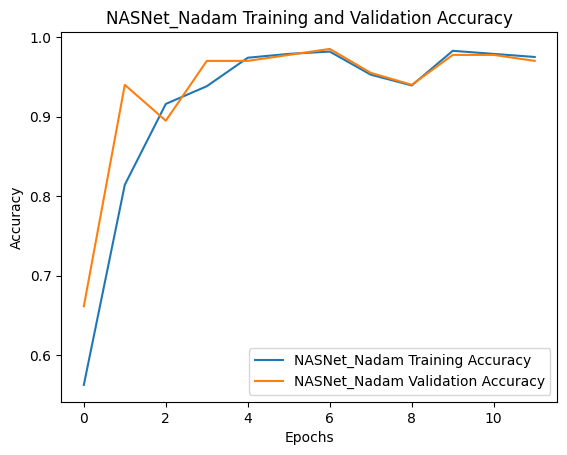

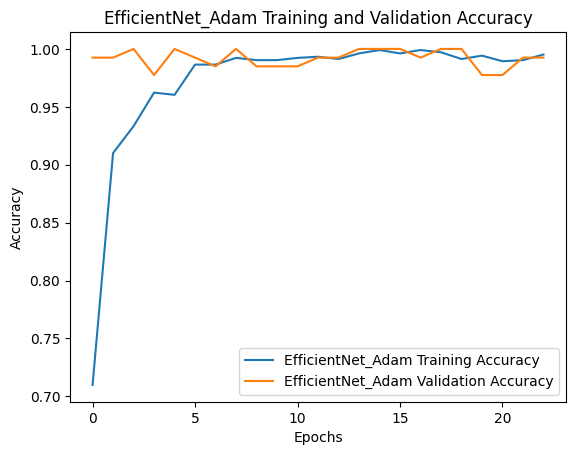

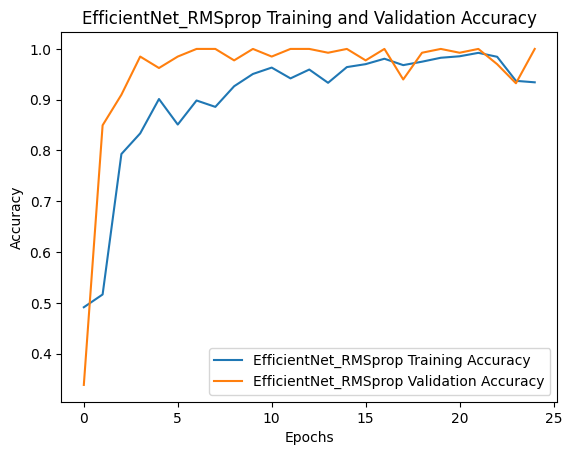

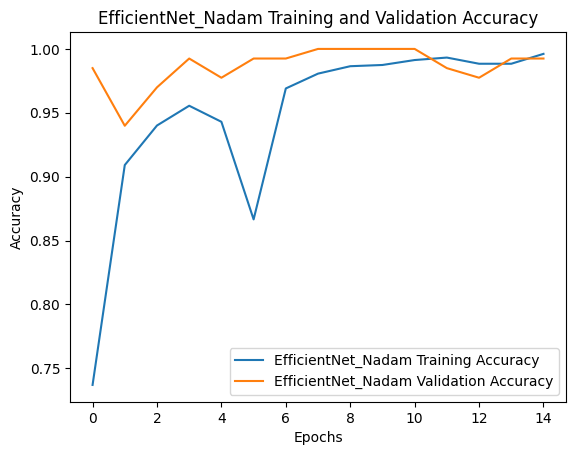

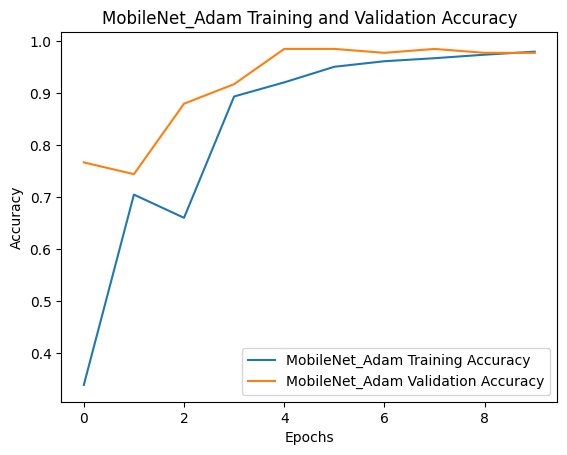

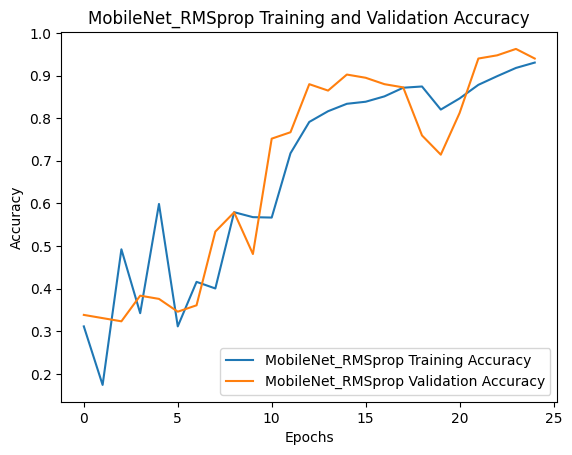

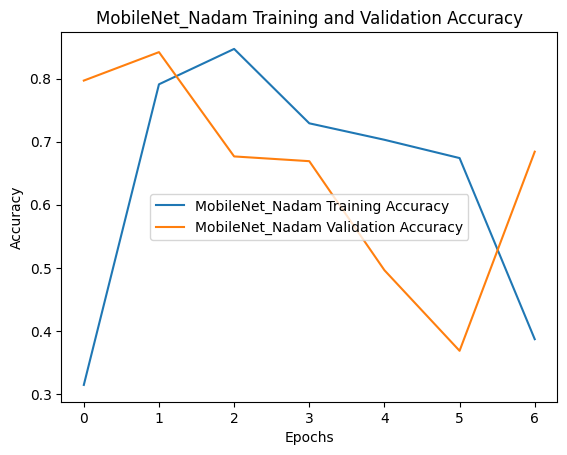

In [13]:
# Plotting training and validation accuracy for each model and optimizer
for key, history in histories.items():
    plt.plot(history['train_acc'], label=f'{key} Training Accuracy')
    plt.plot(history['val_acc'], label=f'{key} Validation Accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title(f"{key} Training and Validation Accuracy")
    plt.legend()
    plt.show()


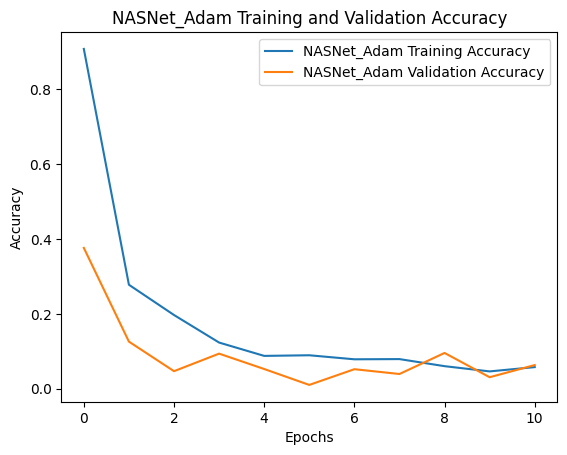

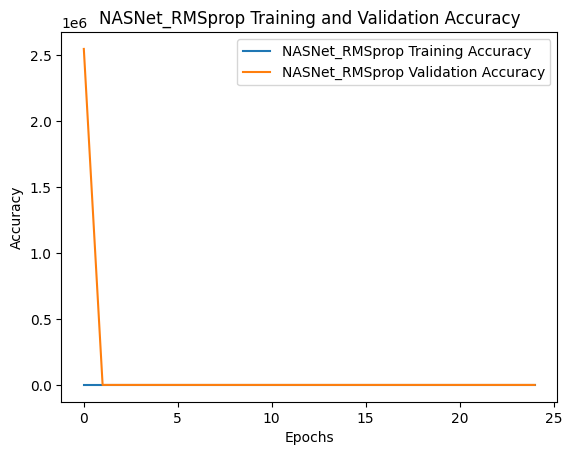

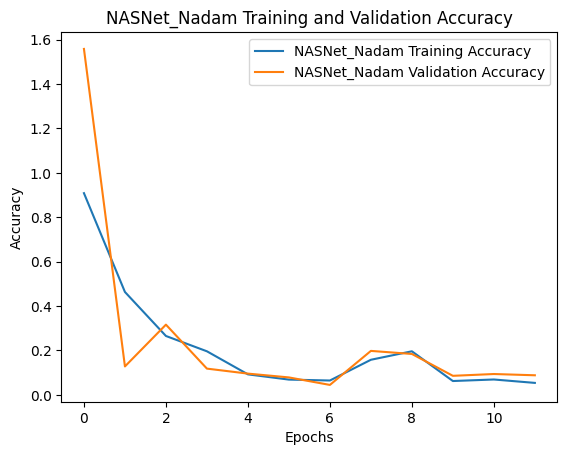

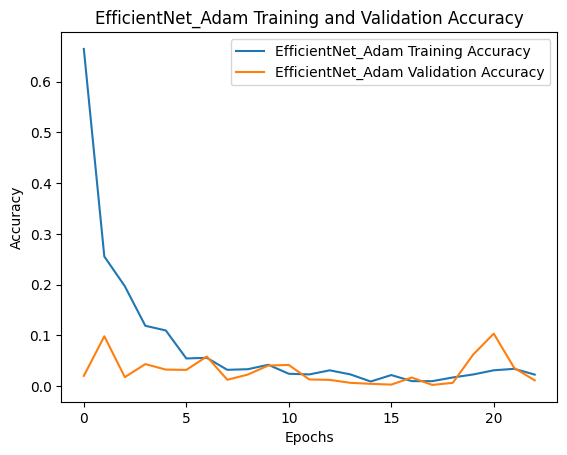

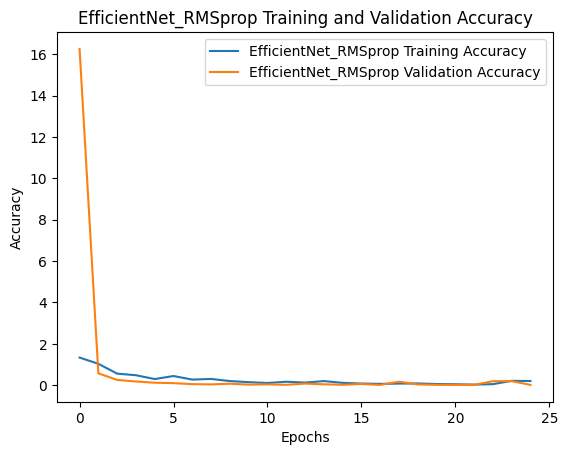

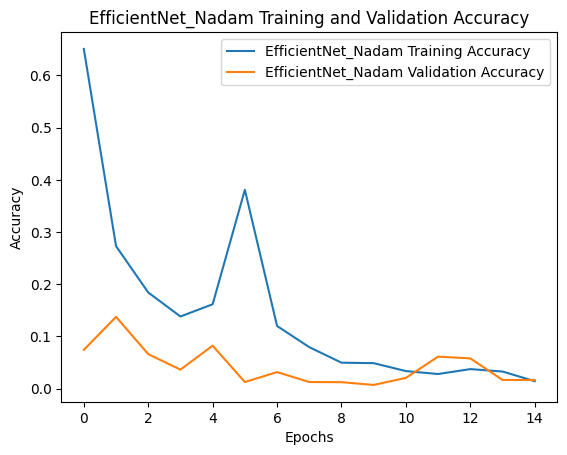

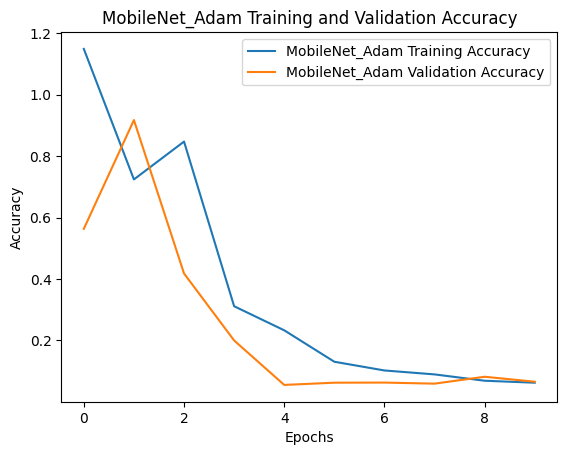

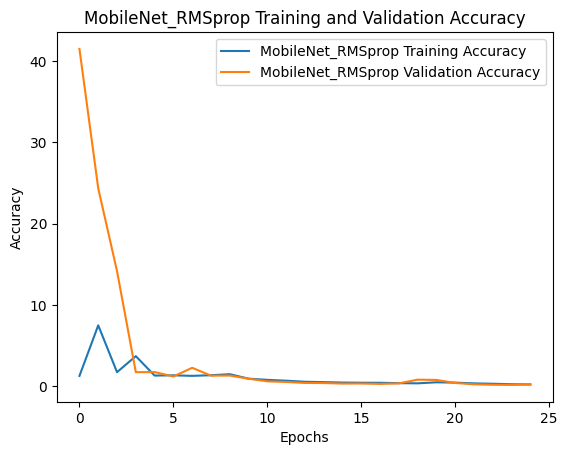

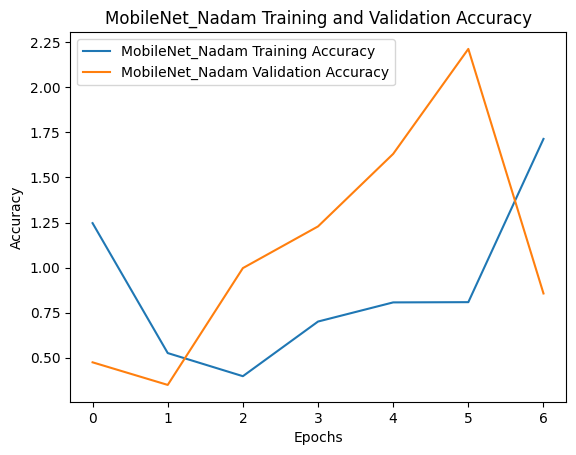

In [14]:
# Plotting training and validation accuracy for each model and optimizer
for key, history in histories.items():
    plt.plot(history['train_loss'], label=f'{key} Training Accuracy')
    plt.plot(history['val_loss'], label=f'{key} Validation Accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title(f"{key} Training and Validation Accuracy")
    plt.legend()
    plt.show()

In [15]:
import seaborn as sns

def plot_confusion_matrix(conf_matrix, model_name, optimizer_name, num_classes=3):
    plt.figure(figsize=(8, 6))
    ax = plt.subplot()
    
    # Create heatmap
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
                xticklabels=["Angular Leaf Spot", "Bean Rust", "Healthy"], 
                yticklabels=["Angular Leaf Spot", "Bean Rust", "Healthy"])
    
    # Add labels and title
    ax.set_xlabel('Predicted Labels')
    ax.set_ylabel('True Labels')
    ax.set_title(f'Confusion Matrix for {model_name} with {optimizer_name}')
    
    plt.show()


Results for NASNet_Adam:
Test Accuracy: 0.9688
Precision: 0.9696
Recall: 0.9688
F1 Score: 0.9689


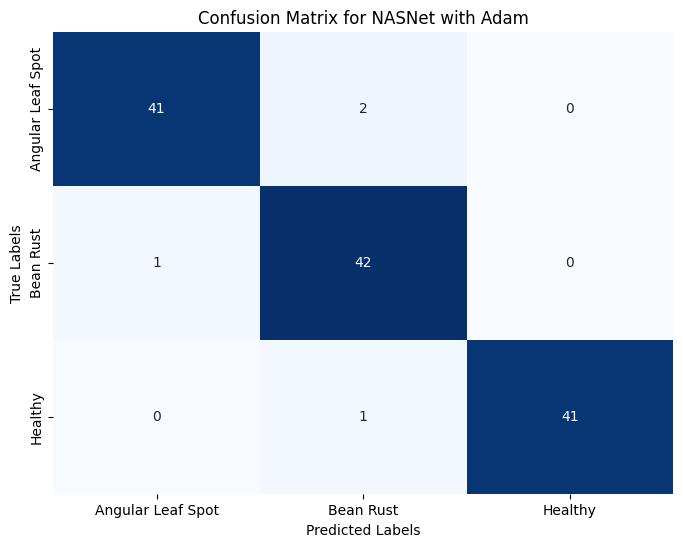

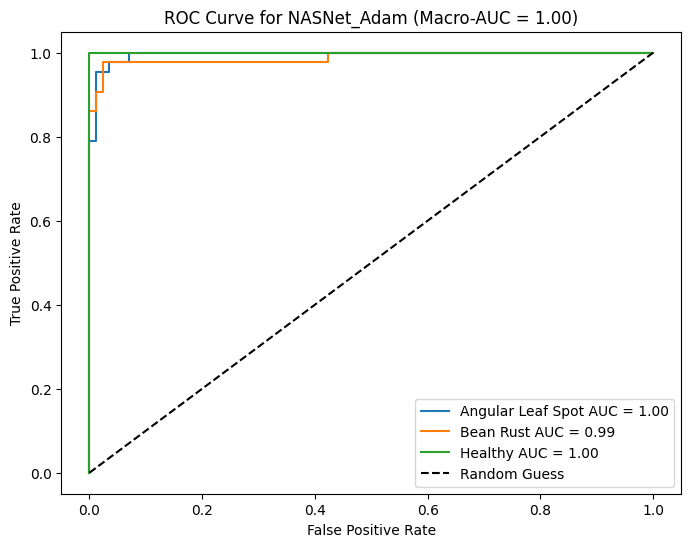

Results for NASNet_RMSprop:
Test Accuracy: 0.8906
Precision: 0.8914
Recall: 0.8906
F1 Score: 0.8897


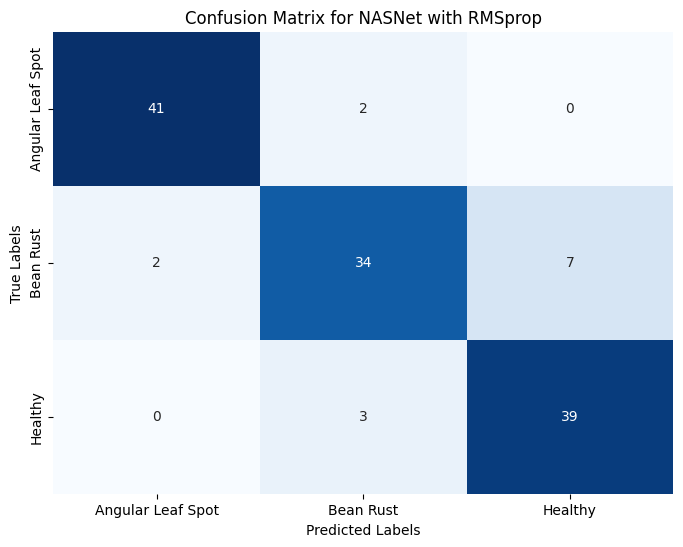

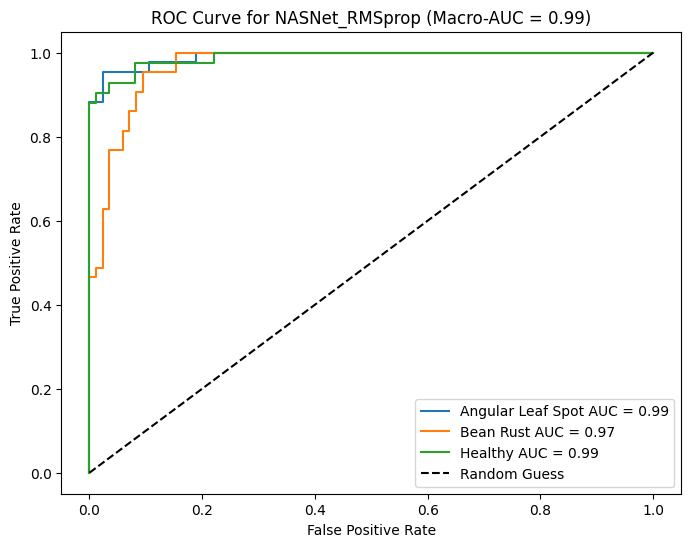

Results for NASNet_Nadam:
Test Accuracy: 0.9609
Precision: 0.9616
Recall: 0.9609
F1 Score: 0.9606


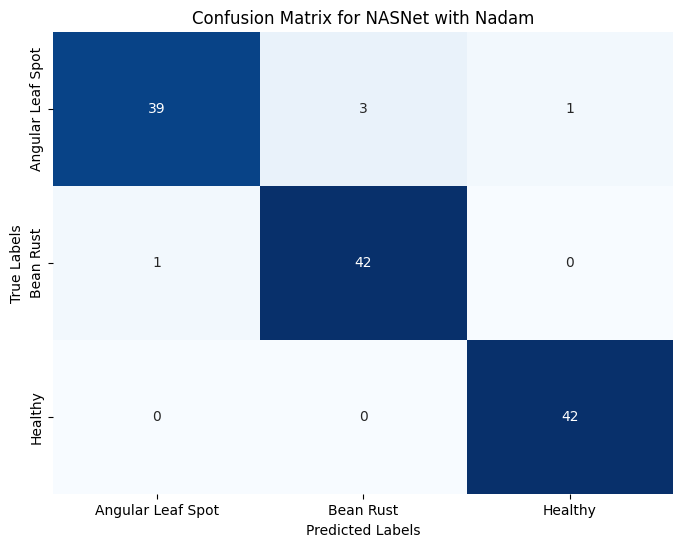

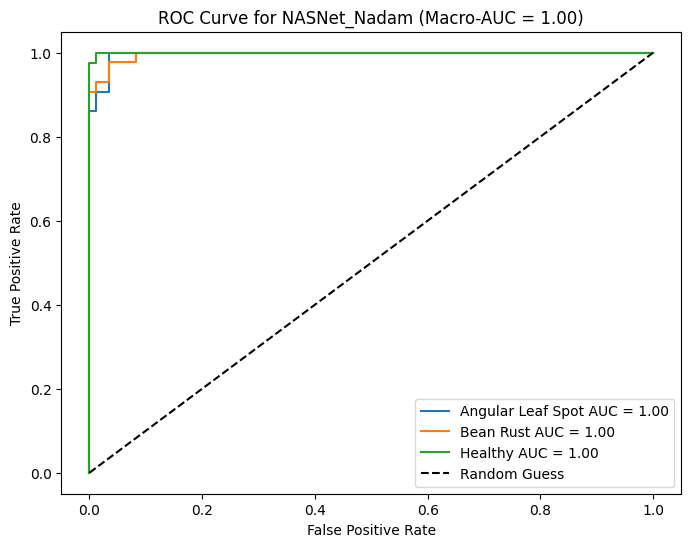

Results for EfficientNet_Adam:
Test Accuracy: 0.9609
Precision: 0.9632
Recall: 0.9609
F1 Score: 0.9609


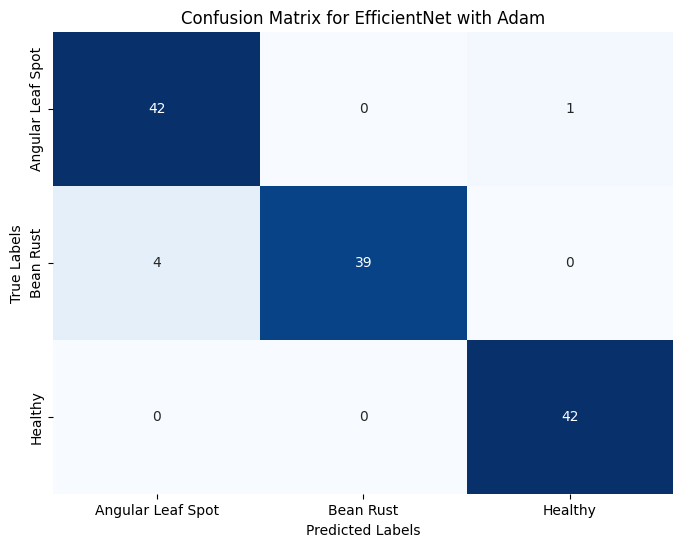

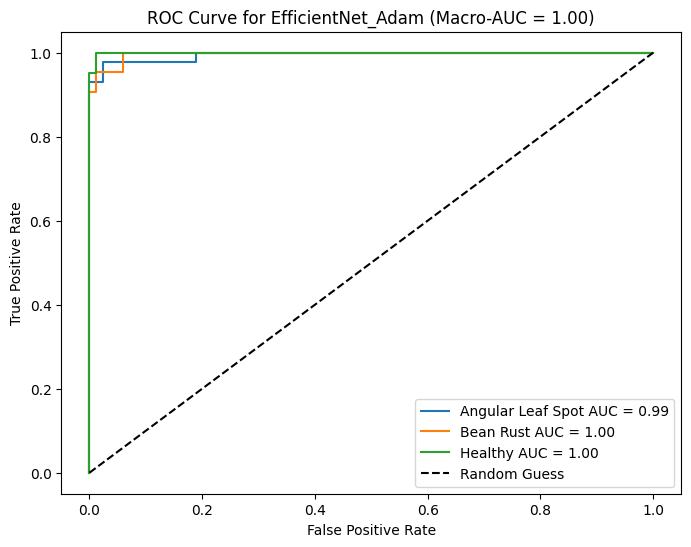

Results for EfficientNet_RMSprop:
Test Accuracy: 0.9766
Precision: 0.9774
Recall: 0.9766
F1 Score: 0.9764


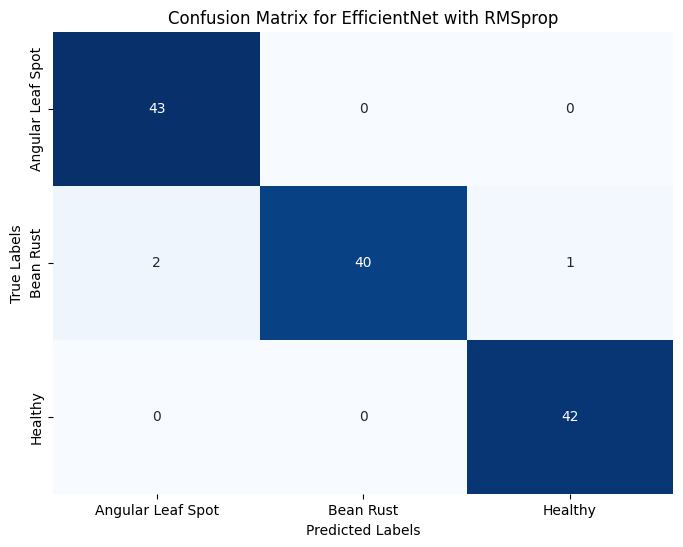

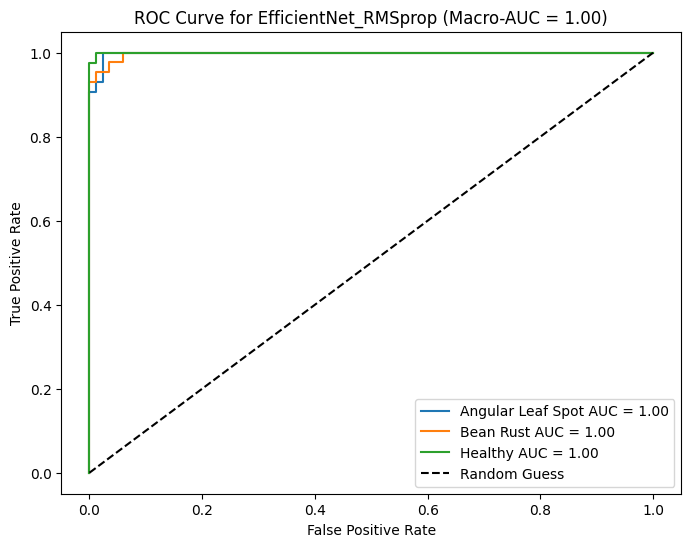

Results for EfficientNet_Nadam:
Test Accuracy: 0.9844
Precision: 0.9851
Recall: 0.9844
F1 Score: 0.9844


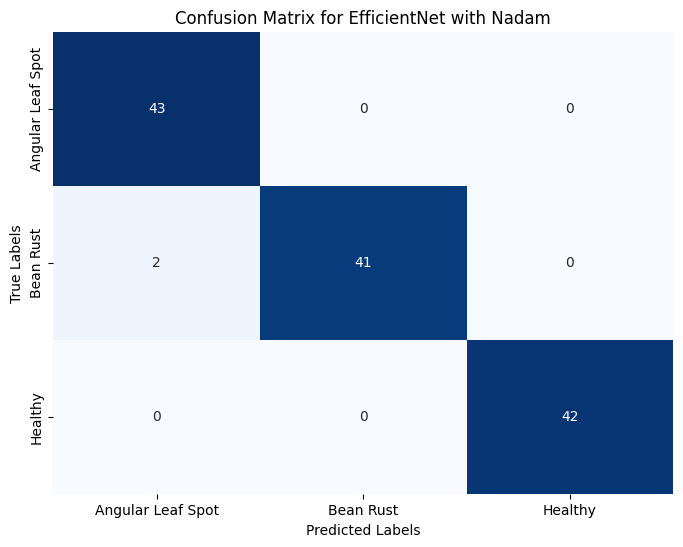

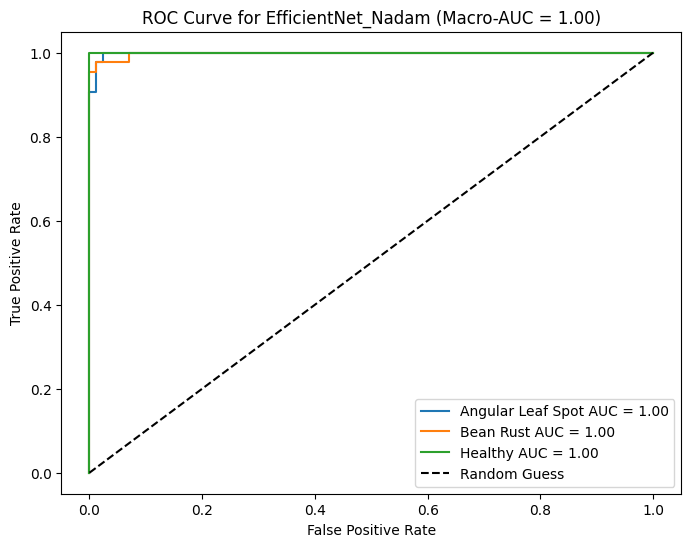

Results for MobileNet_Adam:
Test Accuracy: 0.9609
Precision: 0.9615
Recall: 0.9609
F1 Score: 0.9611


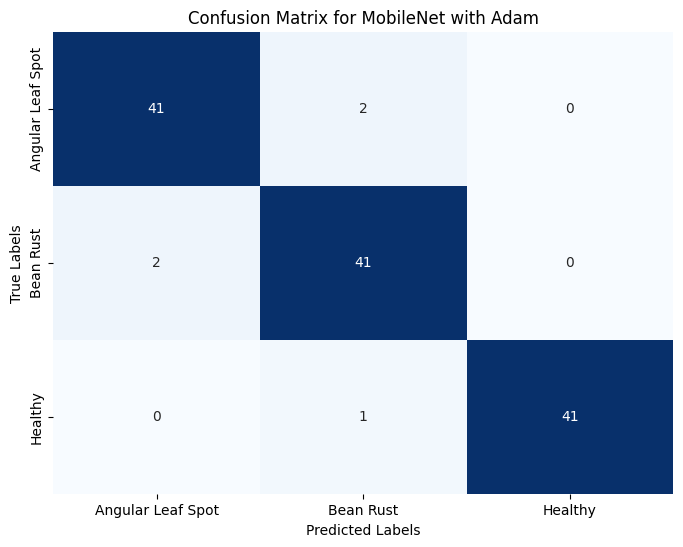

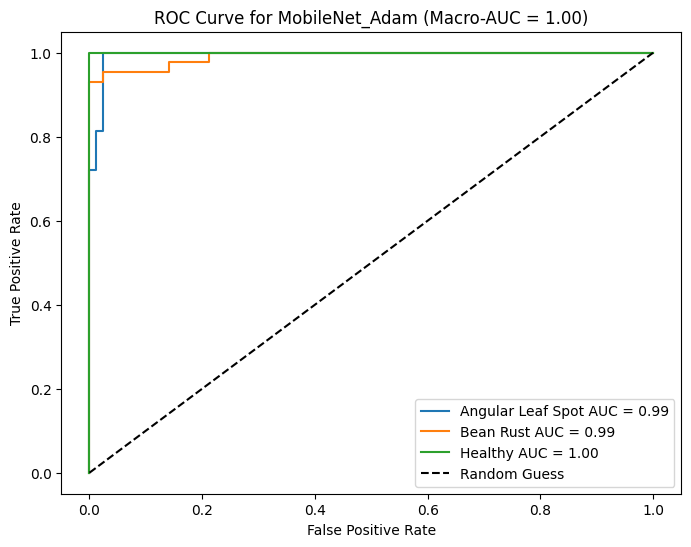

Results for MobileNet_RMSprop:
Test Accuracy: 0.9062
Precision: 0.9219
Recall: 0.9062
F1 Score: 0.9079


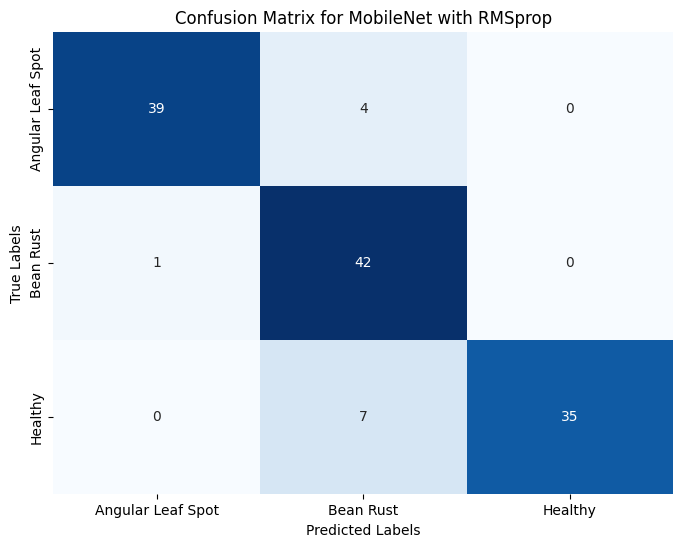

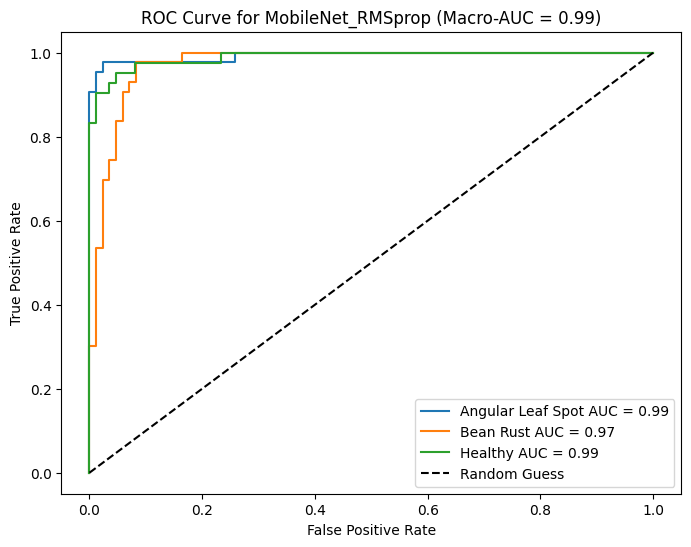

Results for MobileNet_Nadam:
Test Accuracy: 0.6406
Precision: 0.7244
Recall: 0.6406
F1 Score: 0.6209


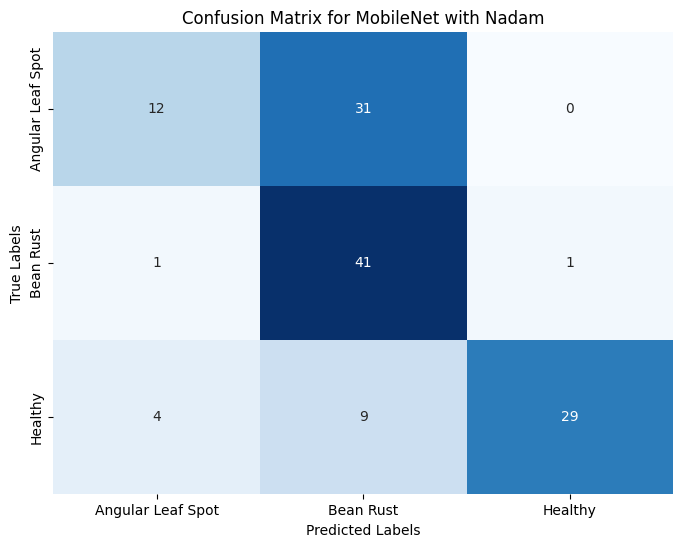

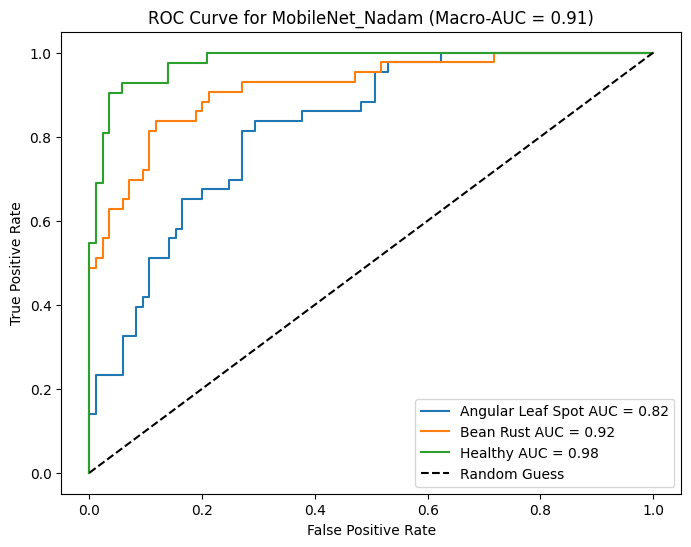

In [16]:
for key, metrics in evaluation_results.items():
    print(f"Results for {key}:")
    print(f"Test Accuracy: {metrics['test_acc']:.4f}")
    print(f"Precision: {metrics['precision']:.4f}")
    print(f"Recall: {metrics['recall']:.4f}")
    print(f"F1 Score: {metrics['f1']:.4f}")
    # Visualize the confusion matrix heatmap
    plot_confusion_matrix(metrics['conf_matrix'], model_name=key.split('_')[0], optimizer_name=key.split('_')[1])
    
    # ROC Curve for each class and macro-average
    plt.figure(figsize=(8, 6))
    for i, class_label in enumerate(["Angular Leaf Spot", "Bean Rust", "Healthy"]):
        plt.plot(metrics['fpr'][i], metrics['tpr'][i], label=f"{class_label} AUC = {metrics['roc_auc'][i]:.2f}")
    plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve for {key} (Macro-AUC = {metrics['roc_auc']['macro']:.2f})")
    plt.legend()
    plt.show()


# Visualize predictions

NASNet_Adam :


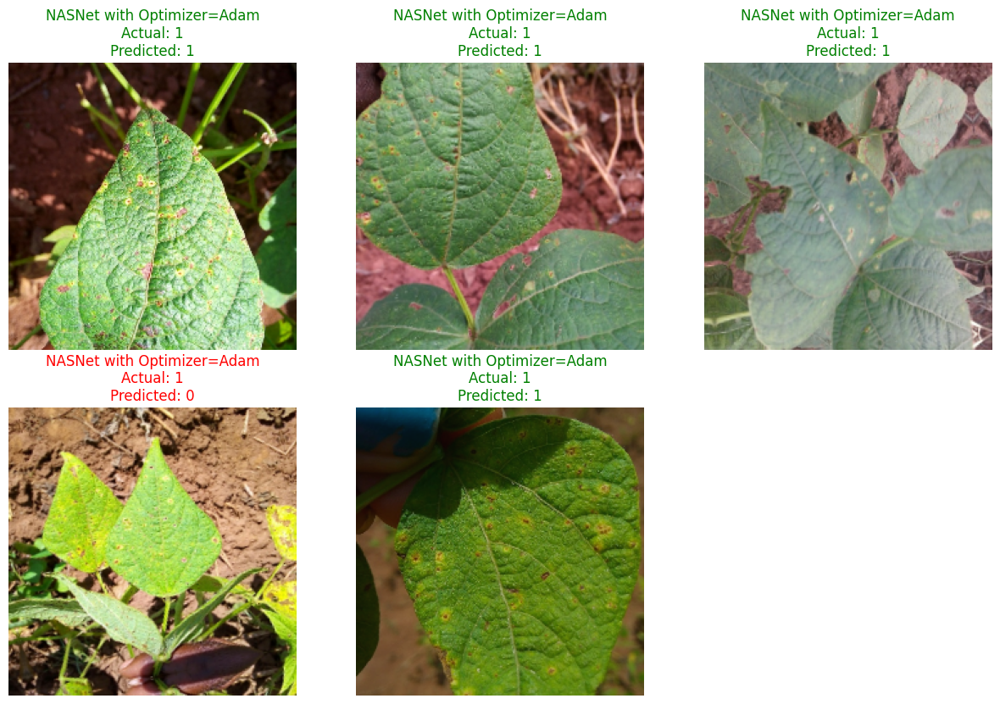

NASNet_RMSprop :


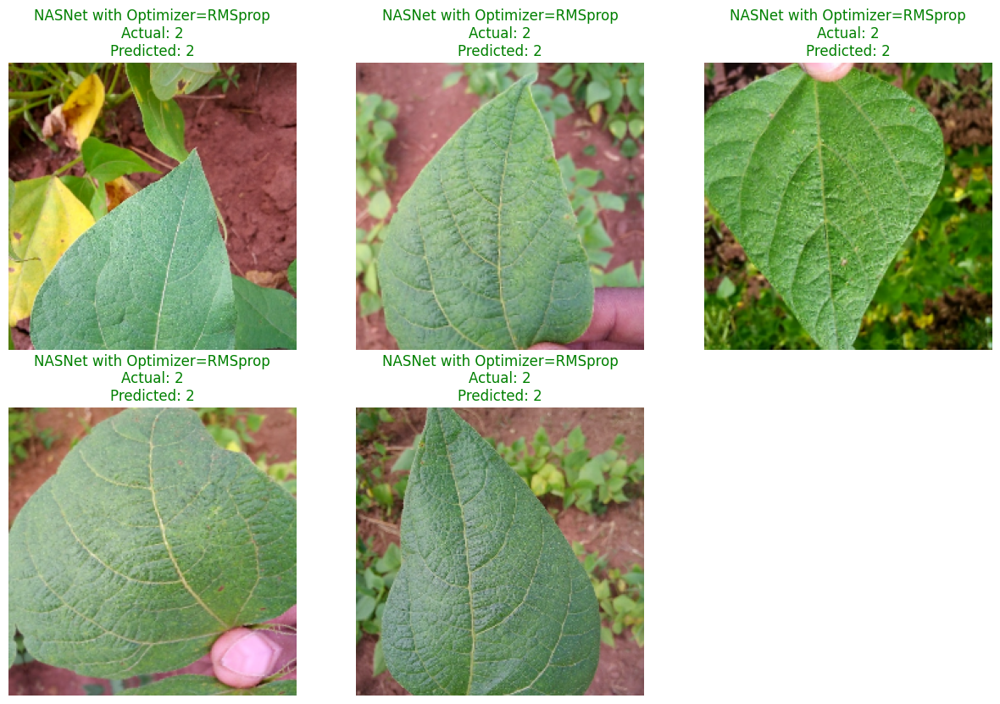

NASNet_Nadam :


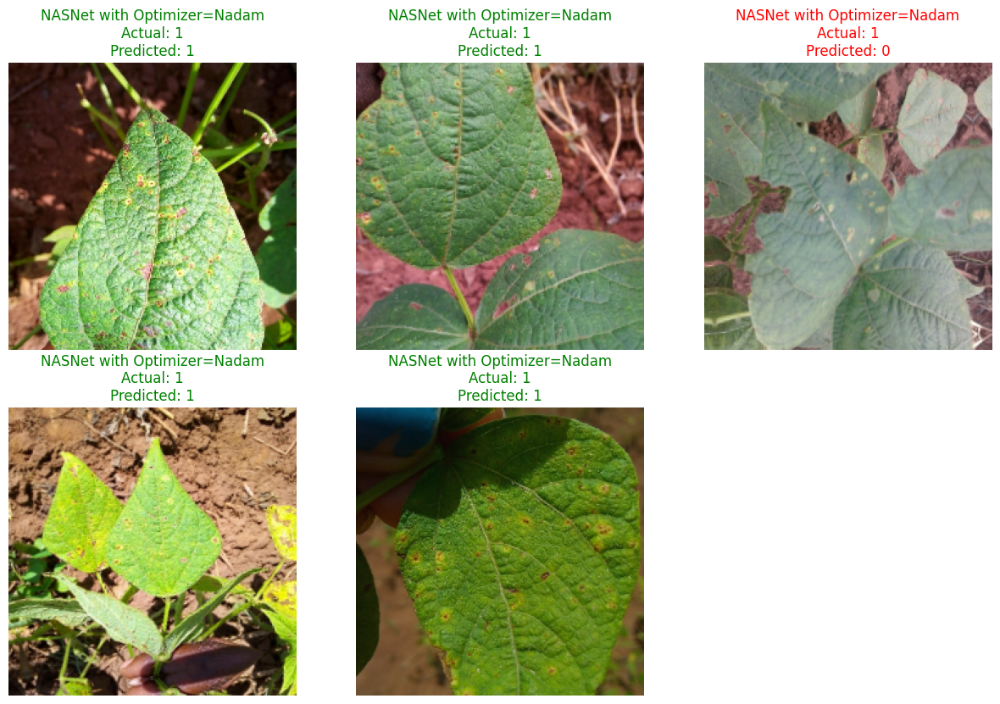

EfficientNet_Adam :


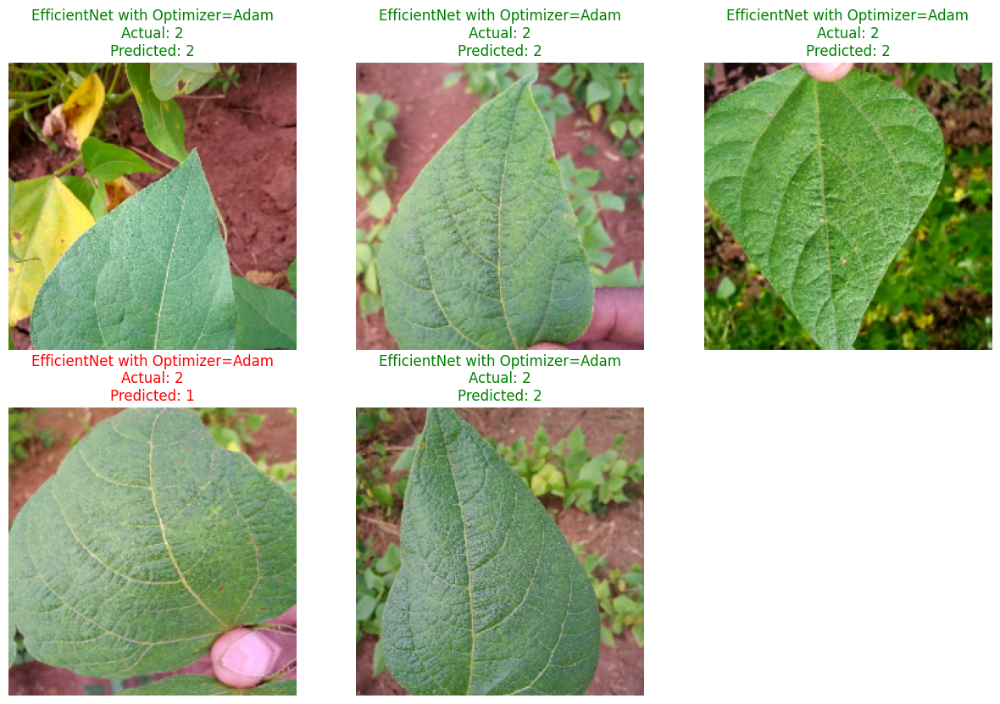

EfficientNet_RMSprop :


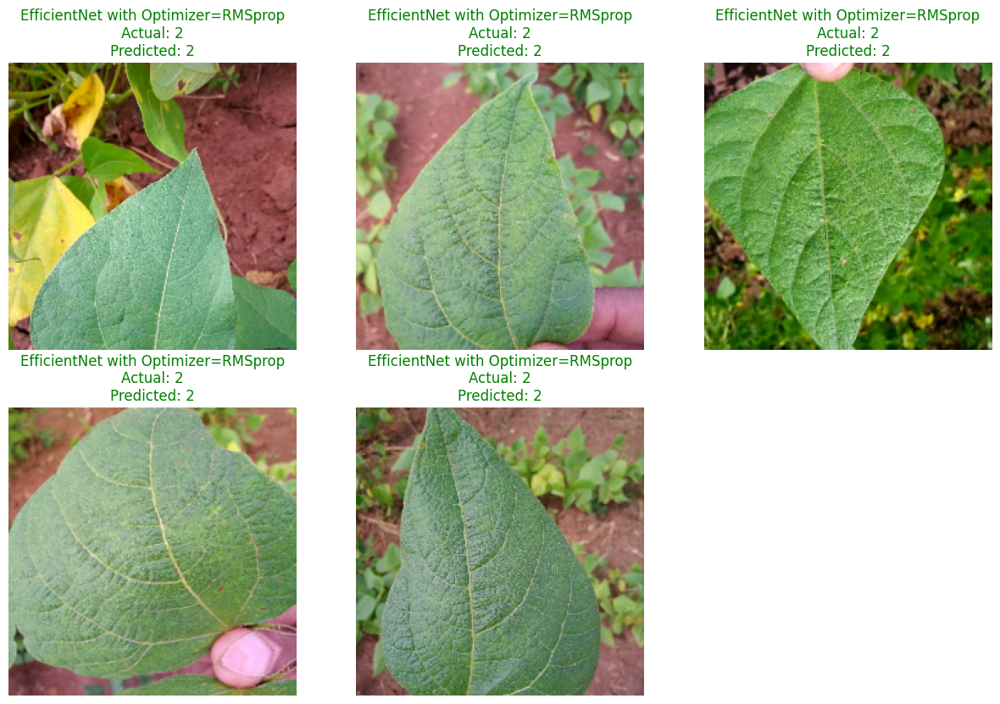

EfficientNet_Nadam :


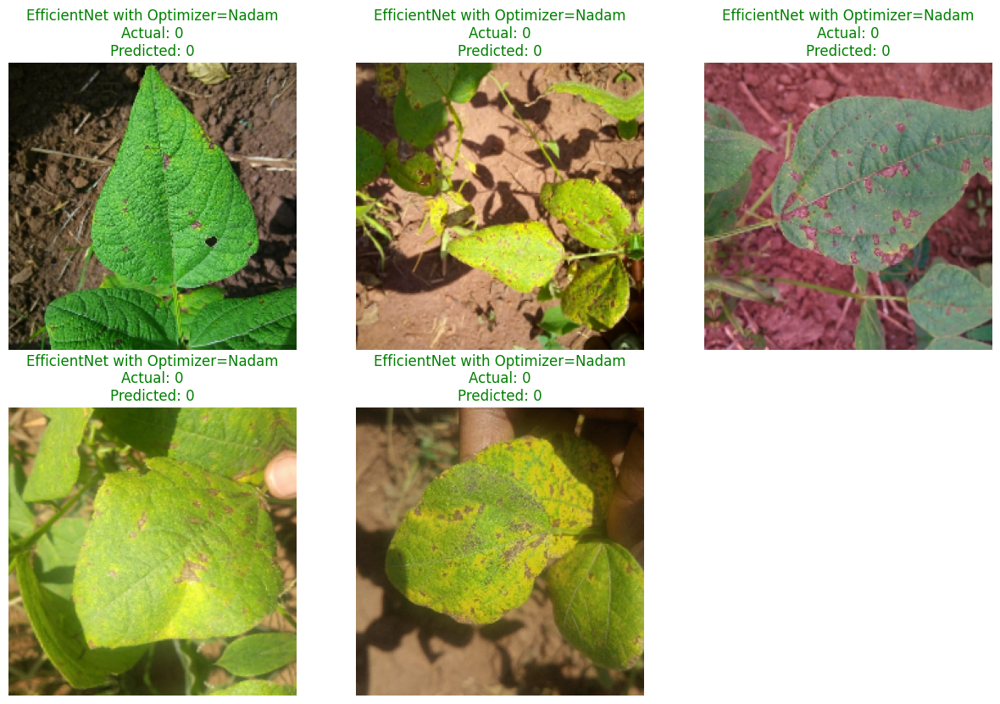

MobileNet_Adam :


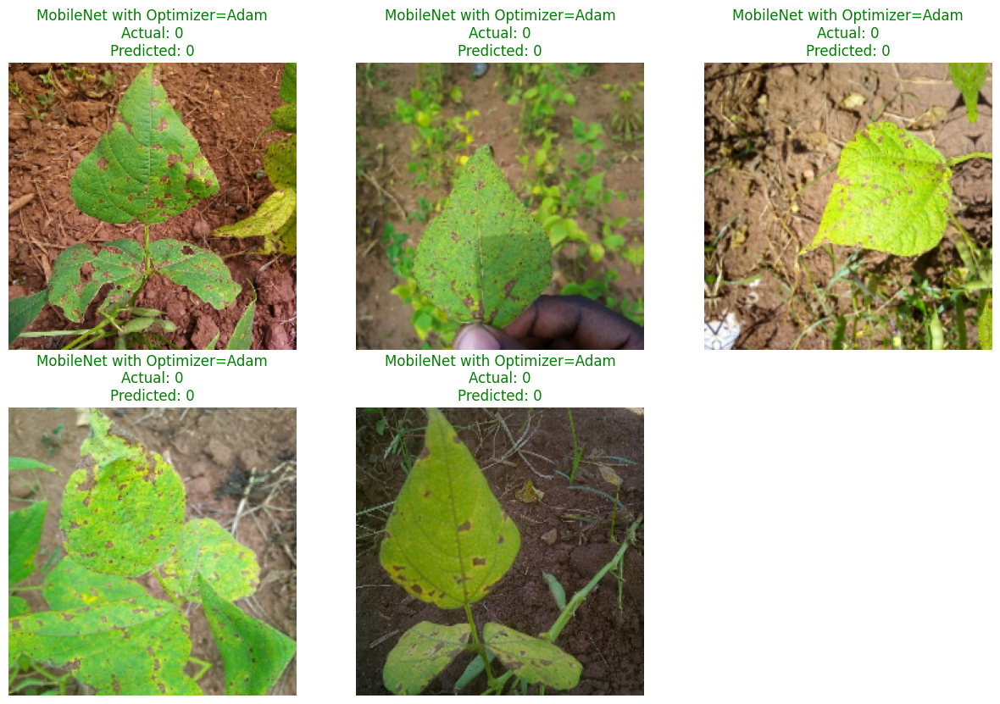

MobileNet_RMSprop :


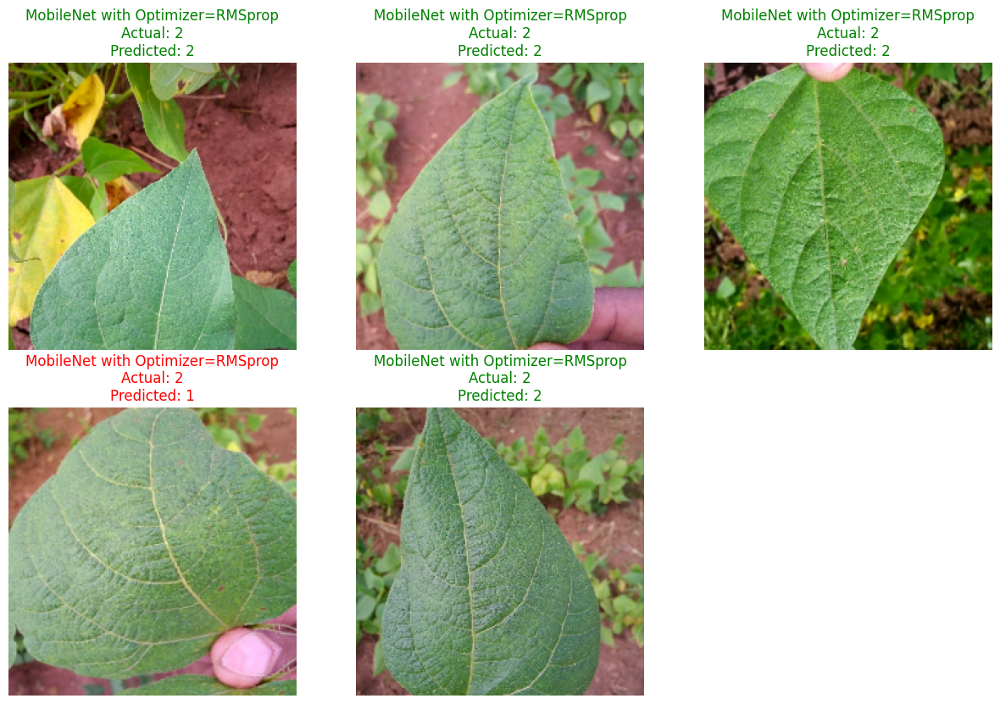

MobileNet_Nadam :


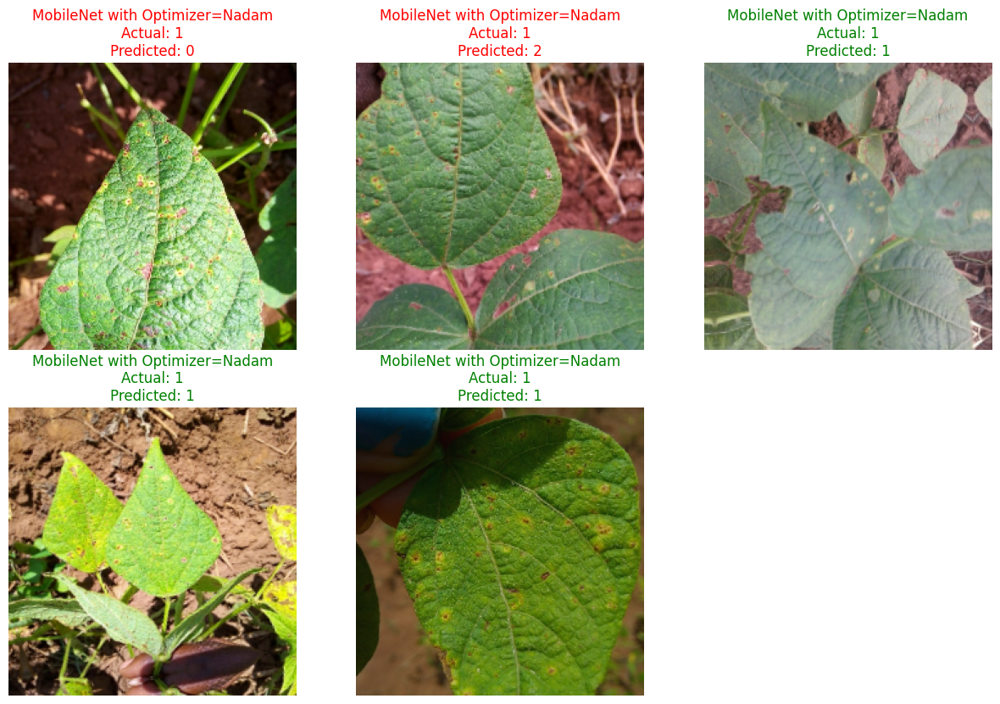

In [21]:
import random

# Visualization Function
def plot_predictions(images, labels, predictions, model_name):
    plt.figure(figsize=(15, 15))
    for i in range(5):
        ax = plt.subplot(3, 3, i + 1)
        img = images[i].cpu().permute(1, 2, 0).numpy()
        img = (img * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])  # Denormalize
        img = np.clip(img, 0, 1)
        plt.imshow(img)
        
        actual_label = labels[i]
        predicted_label = predictions[i]
        color = "green" if actual_label == predicted_label else "red"
        plt.title(f"{model_name}\nActual: {actual_label}\nPredicted: {predicted_label}", color=color)
        plt.axis("off")
    plt.show()


for model_name, model in models_dictionary.items():
    print(model_name, ":")
    
    # Select a random batch from the test loader
    test_batches = list(test_loader)  # Convert test_loader to a list of batches
    random_batch = random.choice(test_batches)  # Choose a random batch
    
    images, labels = random_batch  # Unpack the selected batch
    images, labels = images[:5], labels[:5]  # Take the first 9 images for visualization
    
    outputs = model(images.to(device))  # Get model predictions
    predictions = outputs.argmax(1).cpu()  # Get predicted classes
    
    # Visualize the predictions
    plot_predictions(images, labels, predictions, f"{model_name.split('_')[0]} with Optimizer={model_name.split('_')[1]}")


# Turn the folder into Zip file to download in Kaggle

In [22]:
import os
os.listdir('/kaggle/working/checkpoints')

['EfficientNet_RMSprop_best_model.h5',
 'MobileNet_Adam_best_model.h5',
 'EfficientNet_Adam_best_model.h5',
 'NASNet_RMSprop_best_model.h5',
 'MobileNet_RMSprop_best_model.h5',
 'EfficientNet_Nadam_best_model.h5',
 'MobileNet_Nadam_best_model.h5',
 'NASNet_Nadam_best_model.h5',
 'NASNet_Adam_best_model.h5']

In [23]:
import shutil
shutil.make_archive('/kaggle/working/models', 'zip', '/kaggle/working/checkpoints')

'/kaggle/working/models.zip'